## Data preprocessing strategies and methods for Global Terrorism Database (GTD)

### Data preprocessing strtaegies is based on 4 main steps:
#### - data loading and data cleaning
#### - data reduction
#### - data visualization


#### In this project, we will go cover all steps using the Global Terrorism Database

# 1. Data download and data cleaning

#### Importing all required libraries  

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import os # to change the directory
import missingno as msno # to show missing values
import plotly
import plotly.graph_objs as go

In [2]:
# To change the directory
os.chdir('/Users/njafarov/Downloads')

In [3]:
# downloading data
df = pd.read_excel('globalterrorismdb_0221dist.xlsx')

In [4]:
# Let's have a general view about the size of our data set
df.shape

(201183, 135)

135 columns are quite big and it needs to be reduced. But first, let's understand our columns a little bit more.

In [432]:
pd.set_option("display.max_columns", None)

In [5]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaT,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaT,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaT,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaT,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaT,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


According to the data base webpage, many columns such as 'approxdate', 'alternative','alternative_txt','attacktype2' and etc. are mutualy exclusive and can be removed. 

To prove its mutually exclusiveness, we can analyze missing values.

## 1 Missing values

1. Missing Data Completely At Random (MCAR) - If the probability of missing is the same for all observations, then the variable is missing completely at random (MCAR). In that case, disregarding those values will not bias the inference made
2. Missing Data Not At Random (MNAR): Systematic Missing Values - There is a relationship exist between missing dataset
3. Missing At Random (MAR) - In a dataset the missing value is missing due to the particular variable (men --> salary, women --> age)

In [6]:
# Percentage of missing value in our dataset
mis_value = df.isnull().sum()/len(df)
mis_value = pd.DataFrame(mis_value, columns=['percentage']).sort_values(by='percentage',
                                                                          ascending=False)
# Shows columns with missing percentage higher than 35%
mis_value = mis_value[mis_value.percentage>0.35]

In [7]:
mis_value

,percentage
gsubname3,0.999886
weapsubtype4,0.999652
weapsubtype4_txt,0.999652
weaptype4,0.999637
weaptype4_txt,0.999637
...,...
ransom,0.604534
scite2,0.562219
weapdetail,0.402733
nperps,0.353385


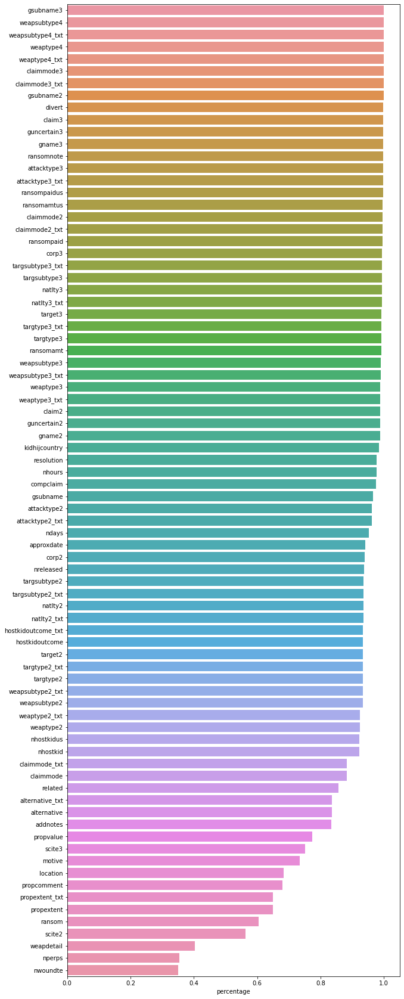

In [8]:
#To show it graphically
plt.figure(figsize=(10,30))
sns.barplot(y=mis_value.index,x=mis_value['percentage'], orient='h')
plt.show()

<AxesSubplot:>

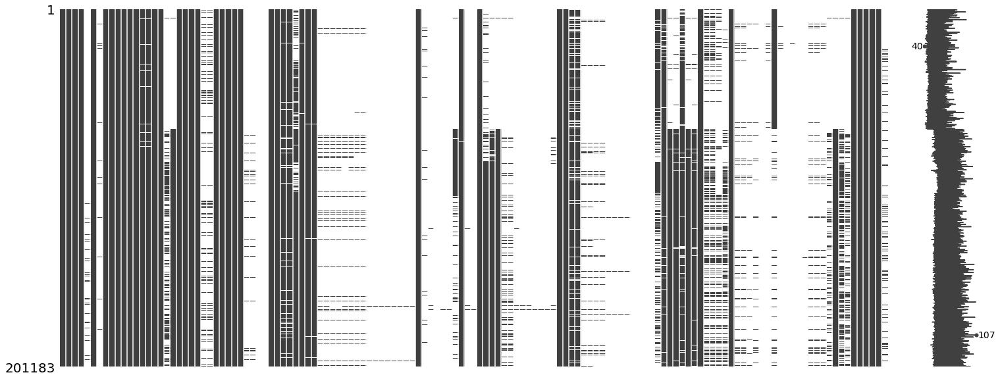

In [9]:
msno.matrix(df)

The matrix also depics the columns with missing values. We can easily remove those columns since they do not affect our analysis. On the other hand, the missing values are not missing completely at random and it's recovery does not make analytical sense. 

In [10]:
# Removing missing values
percentage = 35
min_thresh = int(((100-percentage)/100)*df.shape[0]+1)
df = df.dropna(axis=1, thresh=min_thresh)

In [11]:
# To check
df.isnull().sum()

eventid                 0
iyear                   0
imonth                  0
iday                    0
extended                0
country                 0
country_txt             0
region                  0
region_txt              0
provstate               0
city                  426
latitude             4627
longitude            4628
specificity             1
vicinity                0
summary             66121
crit1                   0
crit2                   0
crit3                   0
doubtterr               0
multiple                0
success                 0
suicide                 0
attacktype1             0
attacktype1_txt         0
targtype1               0
targtype1_txt           0
targsubtype1        11454
targsubtype1_txt    11454
corp1               42539
target1               635
natlty1              1850
natlty1_txt          1850
gname                   0
guncertain1           380
individual              0
nperpcap            69474
claimed             66094
weaptype1   

In [12]:
#To check the percentage
mis_value = df.isnull().sum()/len(df)
mis_value = pd.DataFrame(mis_value, columns=['percentage']).sort_values(by='percentage',
                                                                          ascending=False)
mis_value

,percentage
nperpcap,0.345327
nkillter,0.337340
scite1,0.328969
summary,0.328661
claimed,0.328527
nwoundus,0.321578
nkillus,0.320290
corp1,0.211444
weapsubtype1,0.120164
weapsubtype1_txt,0.120164


In [13]:
df.shape

(201183, 55)

So far, after data cleaning, we trim the columns down to 48.

On the other hand, some of these variables are repeated in different format. For example, 'weapsubtype1' and 'weapsubtype1_txt' represent the same variable - weapon type, first one by code, the second one by text. We need variables with text and thus we can remove dublicate variables. 

In [14]:
pd.options.display.float_format="{:,.2f}".format

In [15]:
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type'},inplace=True)
df=df[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type']]
df['casualities']=df['Killed']+df['Wounded']
df.head(3)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.46,-69.95,Assassination,1.00,0.00,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,1.00
1,1970,0,0,Mexico,North America,Mexico city,19.37,-99.09,Hostage Taking (Kidnapping),0.00,0.00,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,0.00
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.48,120.60,Assassination,1.00,0.00,Employee,NaN,Unknown,Journalists & Media,Unknown,1.00


Now we can revisit our missing value concept and try to fill those values if it is possible

In [16]:
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
city             426
latitude        4627
longitude       4628
AttackType         0
Killed         11950
Wounded        18924
Target           635
Summary        66121
Group              0
Target_type        0
Weapon_type        0
casualities    19601
dtype: int64

Missing values in some variables such as City, latitute or summary can not be replaced as it will lead to different result. In the case of casualties, missing values are not missing at random. If there is missing value in number of casualties, probably it is due to the scale of the terror attack. By filling missing value by median or random sample imputation or by other techniques, we basically can increase the scale of the event and may give it extra importance. Basically our dataset will be distorted. 

## 2. Data Reduction

There are a number of techniques for dimensionality or data reduction. 
1. Missing value ratio - data with too many missing value is unlikely to carry usefull information. We have already utulized this method and reduced our data set
2. Low variance filter - this method checks whether the variable variance change as the value of target variable changes. We cannot apply this method to our dataset since the method requires numerical data. But most of our variables are nominal, except "Killed", "Wounded" and "Casualities".
3. High correlation filter - analyises the correlation between variables and suggests that the variable with high correlation should be removed since it does not contain valuable information. Given the fact that most of our dataset consist of nominal variables, it is impossible to use correlation filter. 
4. Principal Component Analysis (PCA) - is a statistical tool that transforms the multidimensional data into low dimansion by reducing components. This tool is also for numarical data and is not applicable in our analysis. 

To understand which variable better explains our data, we can use visualization tool.

### Distribution of variables

Some general information about our deteset, that helps us to have the first glance

In [17]:
print('Country with Highest Terrorist Attacks:',df['Country'].value_counts().index[0])
print('Regions with Highest Terrorist Attacks:',df['Region'].value_counts().index[0])
print('The most frequent attack type used by terrorist: ', df['AttackType'].value_counts(dropna=True, ascending=False).index[0])
print('Maximum people killed in an attack are:',df['Killed'].max(),'that took place in',
      df.loc[df['Killed'].idxmax()].Year, 'in', df.loc[df['Killed'].idxmax()].Country)
print('The main target of terrorist is:', df['Target_type'].value_counts(dropna=True, ascending=False).index[0])

Country with Highest Terrorist Attacks: Iraq
Regions with Highest Terrorist Attacks: Middle East & North Africa
The most frequent attack type used by terrorist:  Bombing/Explosion
Maximum people killed in an attack are: 1570.0 that took place in 2014 in Iraq
The main target of terrorist is: Private Citizens & Property


Let's take our independt variables to see if they have any effect on the number of terrorist activities

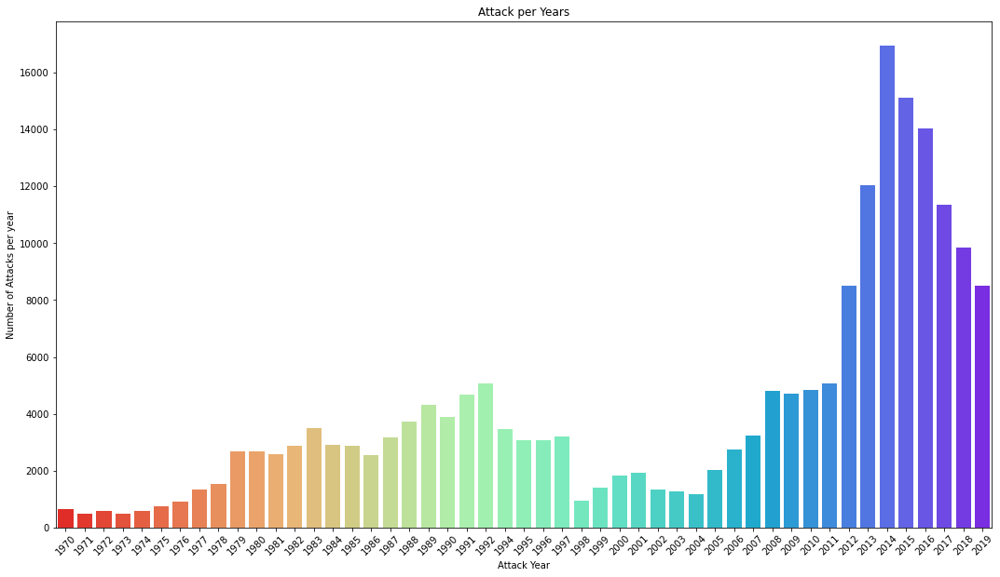

In [83]:
x = df['Year'].unique()
y = df['Year'].value_counts(dropna = False).sort_index()
plt.figure(figsize = (18,10))
sns.barplot(x = x,
           y = y,
           palette = 'rainbow_r')
plt.xticks(rotation = 45)
plt.xlabel('Attack Year')
plt.ylabel('Number of Attacks per year')
plt.title('Attack per Years')
plt.show()

As we can see, the number of attacks increased till 2014,and from 2014, number of terror attack started to decrease. The reason might be quite interesting.

On the other hand, it is dificult to notice a consistent trend within terrorist activities pepr year. 

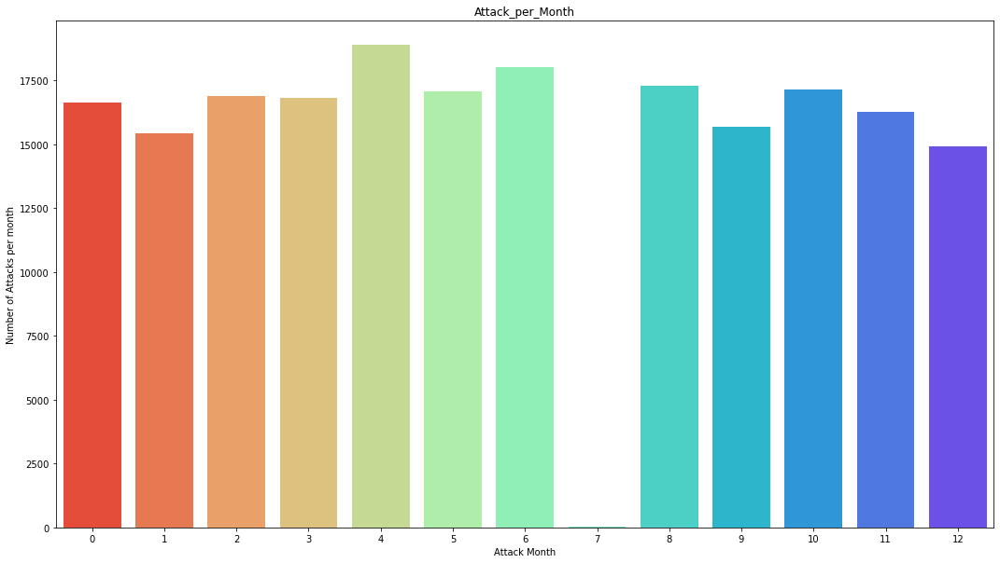

In [35]:
x = df['Month'].unique()
y = df['Month'].value_counts(dropna = False).sort_index()
plt.figure(figsize = (18,10))
sns.barplot(x = x,
           y = y,
           palette = 'rainbow_r')

plt.xlabel('Attack Month')
plt.ylabel('Number of Attacks per month')
plt.title('Attack_per_Month')
plt.show()

It seems that months do not have any effect on the number of attacks terrorist carried out. As we can see, the months are uniformly distributed.

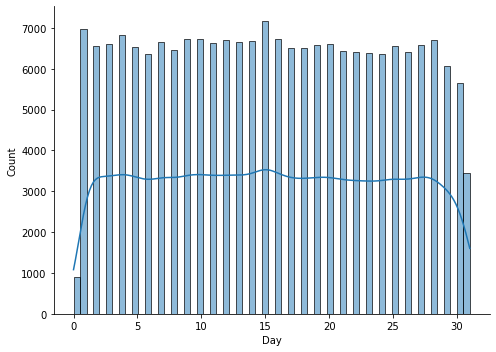

In [39]:
sns.displot(
  data=df,
  x="Day",
  kind="hist",
  aspect=1.4,
    kde=True
)

Days also do not have any explanationary power since its distribution also unified. Terrorists do not prefer particular day in their operation.

In [84]:
import plotly.express as px

#to avoid lagging, only show the first 2k instead of the 180,000 data points.
map_terror = df.head(2000)
map_terror = map_terror[['latitude','longitude']]
fig = px.scatter_geo(map_terror, lat='latitude', lon='longitude')

fig.show()

The map is not clear as it shows dots. Let's try better visual tools.

In [173]:
import folium
from folium.plugins import MarkerCluster 
filter_Year = df['Year'] == 2014

In [183]:
filter_data.loc[:,'city':'longitude'].dropna().values.tolist()

[['Convencion', 8.86879, -73.194094],
 ['Mogadishu', 2.059818, 45.326114],
 ['Quetta', 30.20082, 66.994352],
 ['Dera Bugti', 29.034412, 69.158662],
 ['Buale', 1.097128, 42.598368],
 ['Mosul', 36.354146, 43.143571],
 ['Yathrib', 33.994589, 44.357271],
 ['Tarmiyah', 33.66969, 44.381316],
 ['Singjamei', 24.797922, 93.940517],
 ['Imphal', 24.797922, 93.940517],
 ['Unknown', 31.363647, 63.958611],
 ['Shubra el-Kheima', 30.135777, 31.269641],
 ['Fallujah', 33.349159, 43.784197],
 ['Fallujah', 33.349159, 43.784197],
 ['Fallujah', 33.349159, 43.784197],
 ['Fallujah', 33.349159, 43.784197],
 ['Fallujah', 33.349159, 43.784197],
 ['Ramadi', 33.420949, 43.295662],
 ['Ramadi', 33.420949, 43.295662],
 ['Ramadi', 33.420949, 43.295662],
 ['Ramadi', 33.420949, 43.295662],
 ['Fallujah', 33.349159, 43.784197],
 ['Karma', 33.403057, 43.911866],
 ['Karma', 33.403057, 43.911866],
 ['Qalat', 32.100205, 66.901018],
 ['Rutbah', 33.036022, 40.288159],
 ['Mogadishu', 2.059818, 45.326114],
 ['Mogadishu', 2.059818

In [185]:
filter_data = df[filter_Year] # filter data
#filterData.info()
new_filter_data = filter_data.loc[:,'city':'longitude'] #We are getting the fields for our analysis
new_filter_data = new_filter_data.dropna() # drop all NaN values in both latitude and longitude
list_filter_data = new_filter_data.values.tolist()
# reqFilterDataList

In [191]:
map = folium.Map(location=[0,30], tiles='CartoDB positron', zoom_start=2)
Cluster_marker = folium.plugins.MarkerCluster().add_to(map)

for point in range(0, len(list_filter_data)):
    folium.Marker(location=[list_filter_data[point][1], list_filter_data[point][2]],
                 popup=list_filter_data[point][0]).add_to(Cluster_marker)
map

As we can see, most terrorist attack in 2014 happened in Middle East - 10424. 

### What about types of weapons, do they have any explanation power?

In [51]:
from pandas import DataFrame


weapons = df['Weapon_type'].value_counts()
weapons = DataFrame(weapons)

weapons.reset_index(level=0, inplace=True)
weapons.columns = ['Weapon used', 'Weapon Count']
weapons

,Weapon used,Weapon Count
0,Explosives,100333
1,Firearms,64923
2,Unknown,18462
3,Incendiary,12445
4,Melee,4115
5,Chemical,344
6,Sabotage Equipment,175
7,Vehicle (not to include vehicle-borne explosiv...,170
8,Other,134
9,Biological,36


<AxesSubplot:xlabel='Weapon used'>

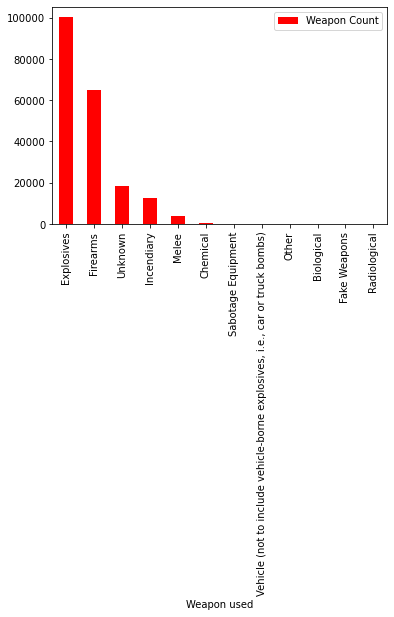

In [52]:
weapons.plot.bar(x='Weapon used', y='Weapon Count', rot=90, color = 'r')


The most 4 types of weapons are explosives, firearms, incendiary and melee. Does access to those weapons have any impact on the number of terrorist activities?

In [106]:
# Total Number of people killed in terror attack
killData = df.loc[:,'Killed']
print('Number of people killed by terror attack:', int(sum(killData.dropna())))# drop the NaN values

#Number of Killed in Terrorist Attacks by Countries
countryData = df.loc[:,'Country']
# countyData
countryKillData = pd.concat([countryData, killData], axis=1)

Number of people killed by terror attack: 456249


In [107]:
attackData = df.loc[:,'AttackType']
# attackData
typeKillData = pd.concat([attackData, killData], axis=1)

In [108]:
typeKillFormatData = typeKillData.pivot_table(columns='AttackType', values='Killed', aggfunc='sum')

In [109]:
#Number of Killed in Terrorist Attacks by Countries
countryData = df.loc[:,'Country']
# countyData
countryKillData = pd.concat([countryData, killData], axis=1)

In [110]:
countryKillFormatData = countryKillData.pivot_table(columns='Country', values='Killed', aggfunc='sum')

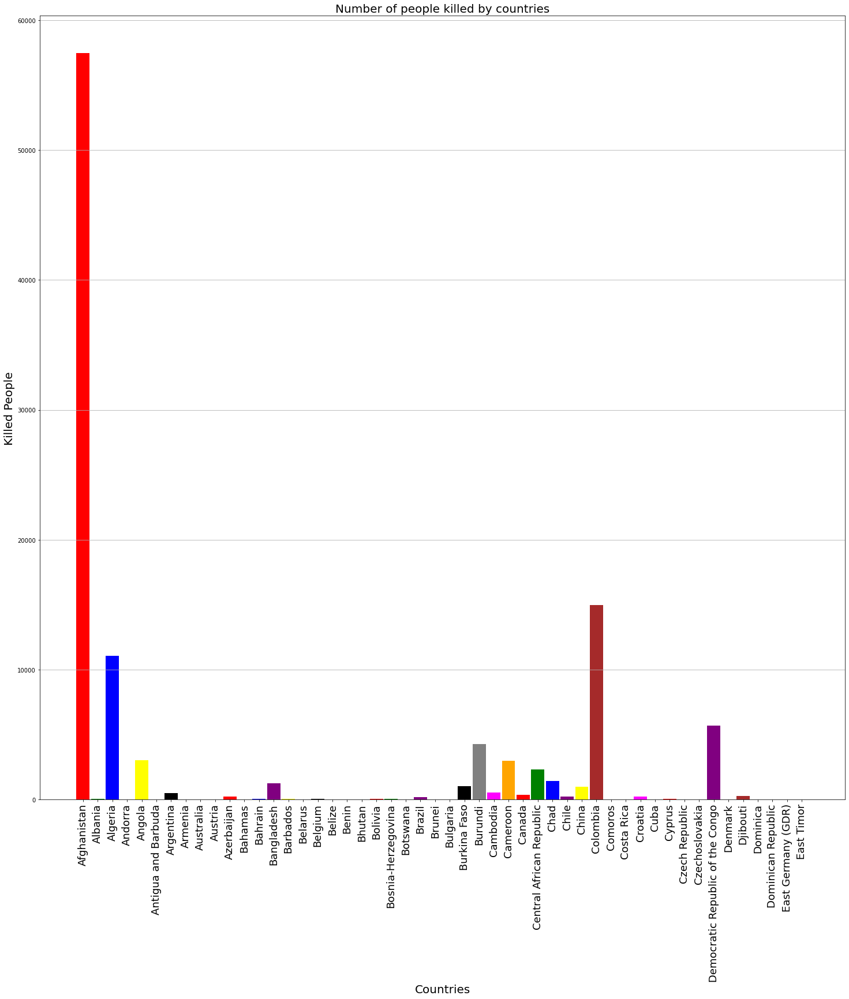

In [111]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=25
fig_size[1]=25
plt.rcParams["figure.figsize"] = fig_size


labels = countryKillFormatData.columns.tolist()
labels = labels[:50] #50 bar provides nice view
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[:50]
values = [int(i[0]) for i in values] # convert float to int
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange'] # color list for bar chart bar color 
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=25
fig_size[1]=25
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
# print(fig_size)
plt.show()

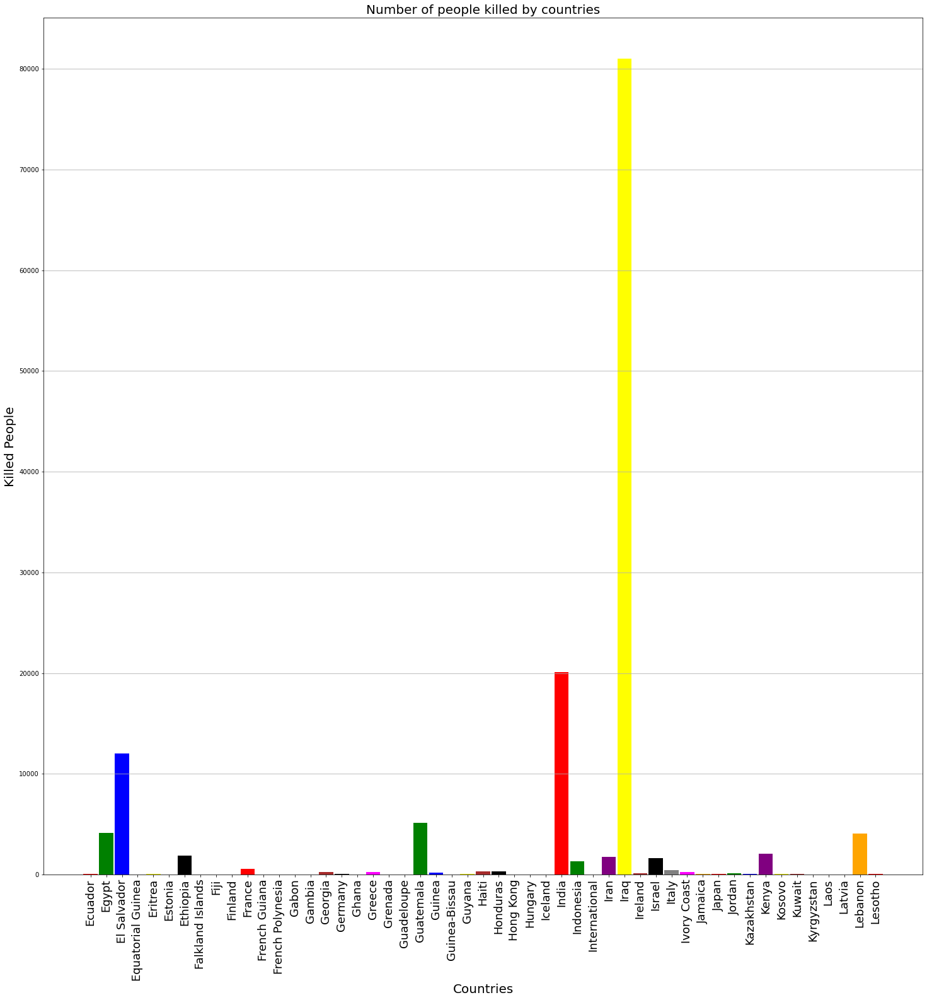

In [81]:
labels = countryKillFormatData.columns.tolist()
labels = labels[50:101]
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[50:101]
values = [int(i[0]) for i in values]
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange']
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=20
fig_size[1]=20
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
plt.show()

Based on both graphs, we can argue that terrorist activities are very intensive in war zones such as Irag and Afghanistan, where people have access to weapons. On the other hand, in the conflict regions government system cannot operate properly, which may lead to chaos and terrorism.

In [125]:
filter_country = df['Country'] == 'Iraq'

In [127]:
filter_data = df[filter_country]

In [136]:
filter_data

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,casualities
2854,1975,3,1,Iraq,Middle East & North Africa,Mosul,36.35,43.14,Hijacking,0.00,1.00,B-737,NaN,Unknown,Airports & Aircraft,Unknown,1.00
4385,1976,12,15,Iraq,Middle East & North Africa,Baghdad,33.30,44.37,Bombing/Explosion,10.00,285.00,Airport terminal,NaN,Unknown,Airports & Aircraft,Explosives,295.00
4393,1976,12,18,Iraq,Middle East & North Africa,Penjwon,NaN,NaN,Hostage Taking (Kidnapping),0.00,0.00,agricultural experts in NE Iraq,NaN,Kurdish Democratic Party-Iraq (KDP),Government (General),Unknown,0.00
4402,1976,12,24,Iraq,Middle East & North Africa,Baghdad,33.30,44.37,Assassination,2.00,0.00,Personnel,NaN,Unknown,Violent Political Party,Firearms,2.00
8688,1979,6,15,Iraq,Middle East & North Africa,Basra,30.51,47.78,Assassination,1.00,0.00,local secretary,NaN,Unknown,Government (General),Unknown,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201140,2019,12,30,Iraq,Middle East & North Africa,Al-Faris district,33.55,44.23,Hostage Taking (Kidnapping),0.00,1.00,Vehicle of Tribal Elder: Sheikh Rafeh Hatim Al...,12/30/2019: Assailants opened fire on the vehi...,Unknown,Private Citizens & Property,Firearms,1.00
201143,2019,12,30,Iraq,Middle East & North Africa,Nasiriyah,31.04,46.26,Armed Assault,1.00,0.00,Protestor: Ali Al-Khafaji,12/30/2019: Assailants shot and killed Ali Al-...,Iran-backed militia,Private Citizens & Property,Firearms,1.00
201144,2019,12,30,Iraq,Middle East & North Africa,Fallujah,33.35,43.78,Bombing/Explosion,5.00,0.00,School,12/30/2019: An explosive device detonated outs...,Islamic State of Iraq and the Levant (ISIL),Educational Institution,Explosives,5.00
201177,2019,12,30,Iraq,Middle East & North Africa,Nada,33.86,45.29,Unknown,1.00,0.00,Post,12/30/2019: Assailants attacked a security pos...,Islamic State of Iraq and the Levant (ISIL),Military,Unknown,1.00


<Figure size 720x1440 with 0 Axes>

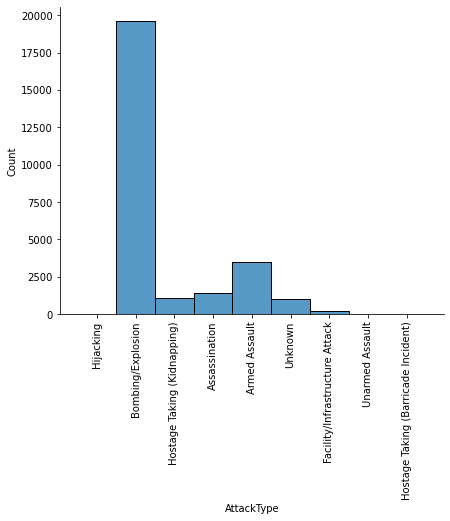

In [138]:
plt.figure(figsize = (10,20))
sns.displot(
  data=filter_data,
  x="AttackType",
  kind="hist",
  aspect=1.4,
    kde=False
)
plt.xticks(fontsize=10, rotation=90)
plt.show()

<Figure size 720x1440 with 0 Axes>

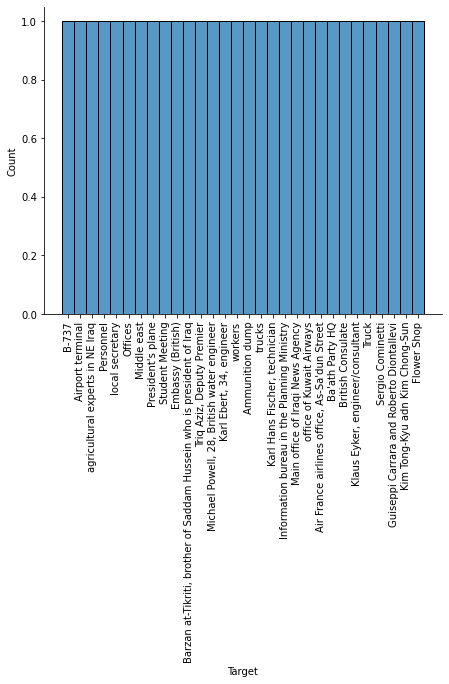

In [141]:
plt.figure(figsize = (10,20))
sns.displot(
  data=filter_data[:30],
  x="Target",
  kind="hist",
  aspect=1.4,
    kde=False
)
plt.xticks(fontsize=10, rotation=90)
plt.show()

In [156]:
new_filter = pd.DataFrame(filter_data['Target'].value_counts()[:20])
new_filter

,Target
Civilians,3406
Unknown,1814
Patrol,1275
Checkpoint,1063
Market,844
Soldiers,656
Vehicle,419
Officers,416
House,394
Shops,373


<Figure size 864x360 with 0 Axes>

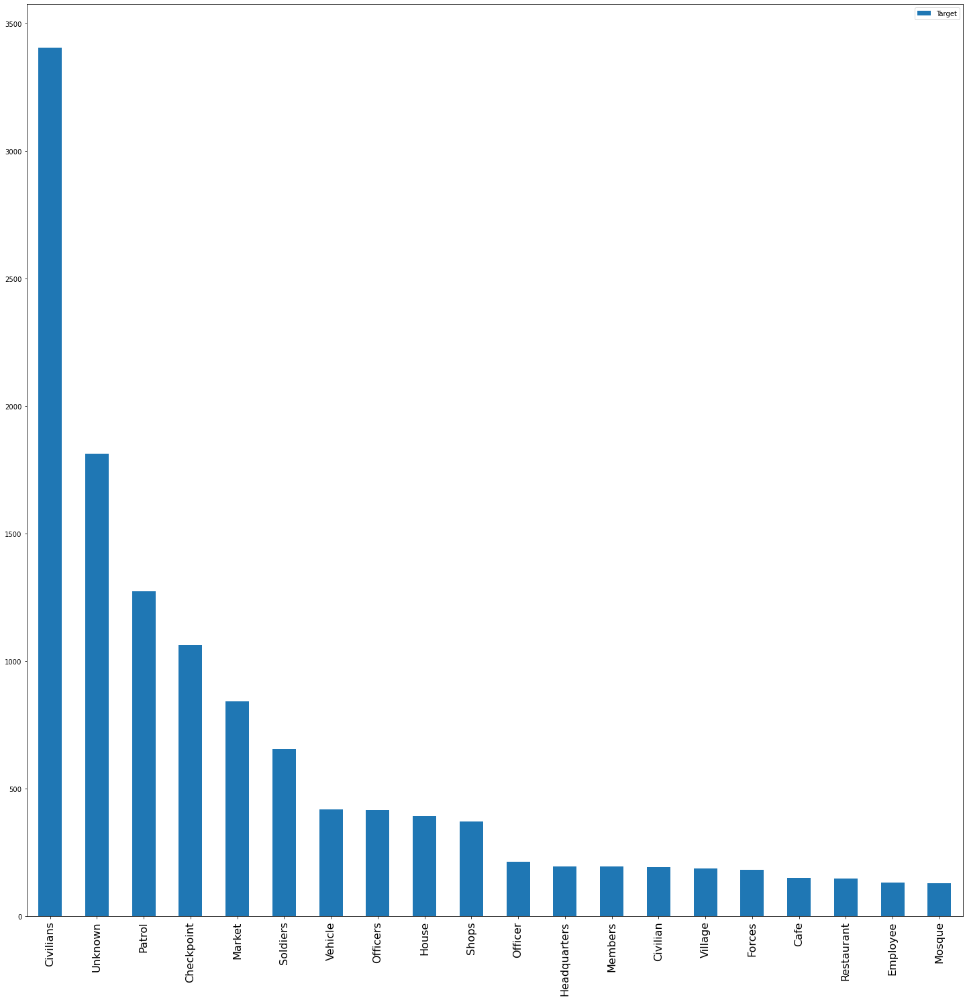

In [157]:
plt.figure(figsize=(12,5))

new_filter.plot(kind='bar')
plt.xticks(fontsize=16, rotation=90)
plt.show()